In [22]:

import scanpy as sc
import pandas as pd
import numpy as np
import os
from pathlib import Path
import re
import json

from PIL import Image

# this line forces theano to use the GPU and should go before importing cell2location
os.environ["THEANO_FLAGS"] = 'device=cuda0,floatX=float32,force_device=True'

# TODO: harcoded configs
crop_size = 40
target_size = 299

#current_folder = Path(__file__).parent
current_folder = globals()['_dh'][0]
visium_dir = current_folder / ".." / ".." / "data" / "uscsc_dump"
image_dir = current_folder / ".." / ".." / "data" / "raw" / "visium"

In [ ]:
# note PIL uses cartesian coordinates with (0, 0) in the upper left corner
# https://pillow.readthedocs.io/en/stable/handbook/concepts.html#coordinate-system

In [2]:
samples = [f for f in os.listdir(visium_dir) if f.startswith("visium")]
samples

['visium_MS197D.h5ad',
 'visium_MS94.h5ad',
 'visium_MS497I.h5ad',
 'visium_CO85.h5ad',
 'visium_MS377I.h5ad',
 'visium_MS466.h5ad',
 'visium_MS377T.h5ad',
 'visium_CO74.h5ad',
 'visium_MS411.h5ad',
 'visium_MS229.h5ad',
 'visium_MS197U.h5ad',
 'visium_CO40.h5ad',
 'visium_CO96.h5ad',
 'visium_MS371.h5ad',
 'visium_MS549H.h5ad',
 'visium_MS549T.h5ad',
 'visium_MS497T.h5ad']

In [3]:
smp = samples[1]
base_name = re.sub(r"\.h5ad$", "", smp)
base_name = re.sub(r"^visium_", "", base_name)
vis_adata = sc.read_h5ad(visium_dir / smp)

In [4]:
image_out_smp =  current_folder / ".." / ".." / "data" / "spot_images" / base_name
image_out_smp.mkdir(parents=True, exist_ok=True)

In [5]:
# check here: https://support.10xgenomics.com/spatial-gene-expression/software/pipelines/latest/output/spatial
smp_img_dir = image_dir / base_name / "outs" / "spatial"
os.listdir(smp_img_dir)

['detected_tissue_image.jpg',
 'scalefactors_json.json',
 'tissue_hires_image.png',
 'tissue_lowres_image.png',
 'aligned_fiducials.jpg',
 'tissue_positions_list.csv']

``tissue_hires_scalef``: A scaling factor that converts pixel positions in the original, full-resolution image to pixel positions in tissue_hires_image.png.

``tissue_lowres_scalef``: A scaling factor that converts pixel positions in the original, full-resolution image to pixel positions in tissue_lowres_image.png.

``fiducial_diameter_fullres``: The number of pixels that span the diameter of a fiducial spot in the original, full-resolution image.

``spot_diameter_fullres``: The number of pixels that span the diameter of a theoretical 65µm spot in the original, full-resolution image.

In [6]:
scale_facs = json.load(open(smp_img_dir / "scalefactors_json.json"))
scale_facs

{'spot_diameter_fullres': 47.73150600000001,
 'tissue_hires_scalef': 0.3172589,
 'fiducial_diameter_fullres': 77.104744,
 'tissue_lowres_scalef': 0.095177665}

``barcode``: The sequence of the barcode associated to the spot.

``in_tissue``: Binary, indicating if the spot falls inside (1) or outside (0) of tissue.

``array_row``: For Visium slide (6.5 mm Capture Area), the row coordinate of the spot in the array from 0 to 77. The array has 78 rows. For Visium slides (11 mm Capture Area), the row coordinate of the spot range from 0 to 127 as the array has 128 rows.

``array_col``: The column coordinate of the spot in the array. In order to express the "orange crate" arrangement of the spots, for Visium slides (6.5 mm Capture Area) this column index uses even numbers from 0 to 126 for even rows, and odd numbers from 1 to 127 for odd rows with each row (even or odd) resulting in 64 spots. For Visium slides (11 mm Capture Area) this column index uses even numbers from 0 to 222 for even rows, and odd numbers from 1 to 223 for odd rows with each row (even or odd) resulting in 111 spots.

``pxl_row_in_fullres``: The row pixel coordinate of the center of the spot in the full resolution image.

``pxl_col_in_fullres``: The column pixel coordinate of the center of the spot in the full resolution image.

In [7]:
tissue_pos = pd.read_csv(smp_img_dir / "tissue_positions_list.csv", header=None, names=["barcode", "in_tissue", "array_row", "array_col", "pxl_row_in_fullres", "pxl_col_in_fullres"])
tissue_pos.set_index("barcode", inplace=True)
tissue_pos = tissue_pos.loc[vis_adata.obs_names.to_numpy()]
tissue_pos

,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres
barcode,,,,,
AAACAACGAATAGTTC-1,1,0,16,4695,5676
AAACAAGTATCTCCCA-1,1,50,102,1710,2321
AAACAATCTACTAGCA-1,1,3,43,3715,5433
AAACAGAGCGACTCCT-1,1,14,94,1882,4633
AAACATTTCCCGGATT-1,1,61,97,1930,1628
...,...,...,...,...,...
TTGTGTTTCCCGAAAG-1,1,51,59,3290,2340
TTGTTCAGTGTGCTAC-1,1,24,64,3016,4053
TTGTTGTGTGTCAAGA-1,1,31,77,2563,3581


In [54]:
image = vis_adata.uns["spatial"][base_name]["images"]["hires"] # or lowres?
print(image.shape)
print(image.dtype)

(1965, 2000, 3)
float32


In [9]:
if image.dtype == np.float32 or image.dtype == np.float64:
    image = (image * 255).astype(np.uint8)
img_pillow = Image.fromarray(image)

if img_pillow.mode == "RGBA":
    img_pillow = img_pillow.convert("RGB")

img_pillow._size
#img_pillow

(2000, 1965)

In [14]:
coord = tissue_pos[["pxl_row_in_fullres", "pxl_col_in_fullres"]]
coord["imagerow"] = coord["pxl_row_in_fullres"] * scale_facs["tissue_hires_scalef"]
coord["imagecol"] = coord["pxl_col_in_fullres"] * scale_facs["tissue_hires_scalef"]
coord

/tmp/ipykernel_149231/157071419.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coord["imagerow"] = coord["pxl_row_in_fullres"] * scale_facs["tissue_hires_scalef"]
/tmp/ipykernel_149231/157071419.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coord["imagecol"] = coord["pxl_col_in_fullres"] * scale_facs["tissue_hires_scalef"]


,pxl_row_in_fullres,pxl_col_in_fullres,imagerow,imagecol
barcode,,,,
AAACAACGAATAGTTC-1,4695,5676,1489.530536,1800.761516
AAACAAGTATCTCCCA-1,1710,2321,542.512719,736.357907
AAACAATCTACTAGCA-1,3715,5433,1178.616814,1723.667604
AAACAGAGCGACTCCT-1,1882,4633,597.081250,1469.860484
AAACATTTCCCGGATT-1,1930,1628,612.309677,516.497489
...,...,...,...,...
TTGTGTTTCCCGAAAG-1,3290,2340,1043.781781,742.385826
TTGTTCAGTGTGCTAC-1,3016,4053,956.852842,1285.850322
TTGTTGTGTGTCAAGA-1,2563,3581,813.134561,1136.104121


In [15]:
scale_facs["spot_diameter_fullres"] * scale_facs["tissue_hires_scalef"]

15.143245088903404

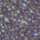

generate tile at location (1800.7615164000001, 1489.5305355)


In [46]:
# from: https://github.com/BiomedicalMachineLearning/stLearn/blob/09c8d7a79979268fe78273fcb25726c5e94c2c6c/stlearn/image_preprocessing/image_tiling.py#L13
tile_names = []
verbose = True
for i, (imagerow, imagecol) in enumerate(zip(coord["imagerow"], coord["imagecol"])):
    if i > 0:
        break
    imagerow_down = imagerow - crop_size / 2
    imagerow_up = imagerow + crop_size / 2
    imagecol_left = imagecol - crop_size / 2
    imagecol_right = imagecol + crop_size / 2
    tile = img_pillow.crop(
        (imagecol_left, imagerow_down, imagecol_right, imagerow_up)
    )
    tile.thumbnail((target_size, target_size), Image.Resampling.LANCZOS)
    tile.resize((target_size, target_size))
    display(tile)
    tile_name = str(imagecol) + "-" + str(imagerow) + "-" + str(crop_size)
    out_tile = image_out_smp / (tile_name + ".jpeg")
    tile_names.append(str(out_tile))
    if verbose:
        print(
            "generate tile at location ({}, {})".format(
                str(imagecol), str(imagerow)
            )
        )
    tile.save(out_tile, "JPEG")

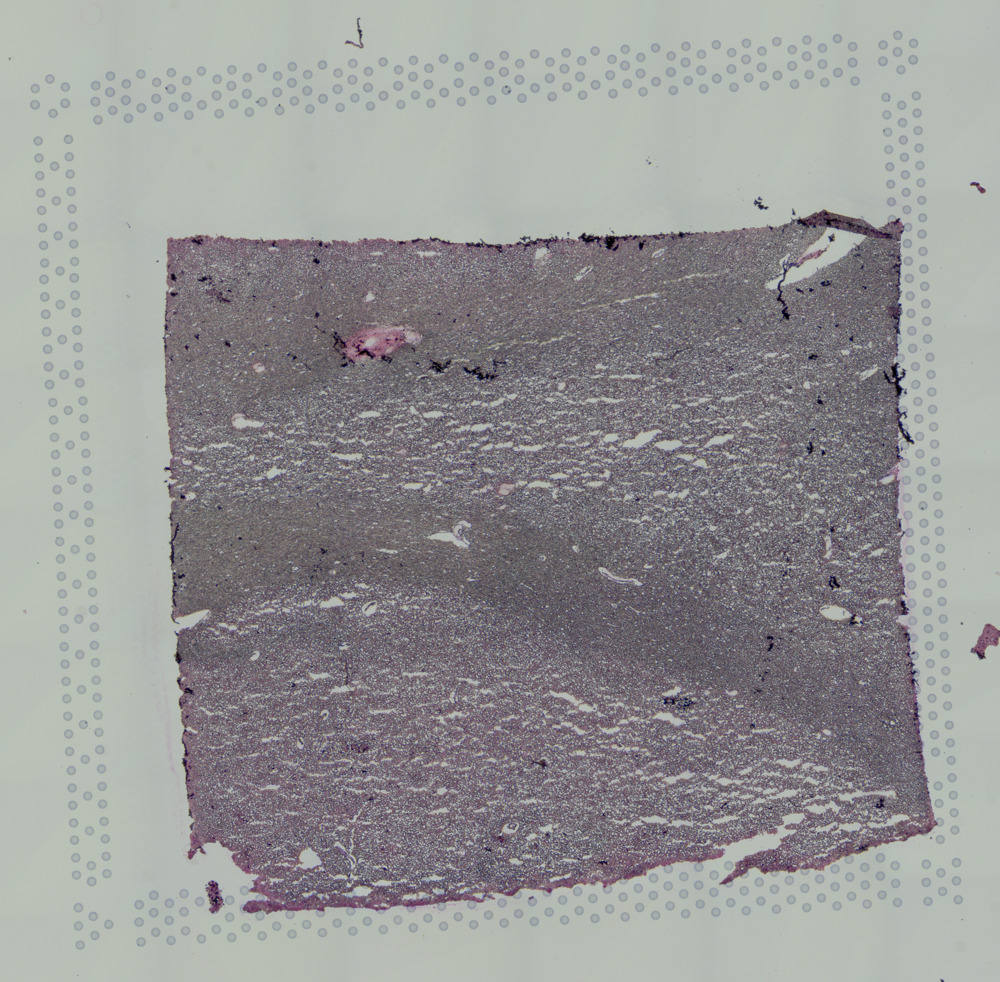

In [40]:
img_pillow

imagerow_down=1469
imagerow_up=1509
imagecol_left=1780
imagecol_right=1820


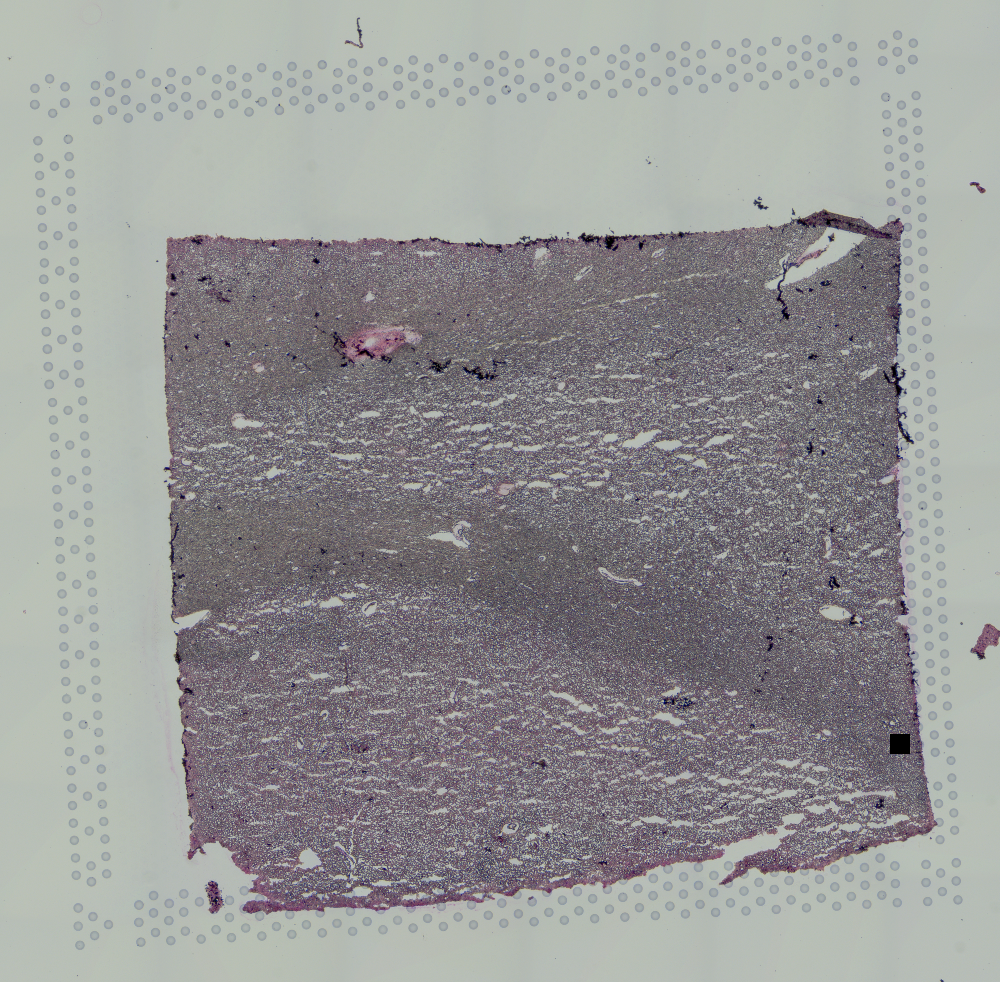

In [52]:
img = img_pillow.copy()
pixels = img.load()

cell_i = 0
imagerow = coord.iloc[cell_i]["imagerow"]
imagecol = coord.iloc[cell_i]["imagecol"]

imagerow_down = int(imagerow - crop_size / 2)
imagerow_up = int(imagerow + crop_size / 2)
imagecol_left = int(imagecol - crop_size / 2)
imagecol_right = int(imagecol + crop_size / 2)
print(f"{imagerow_down=}")
print(f"{imagerow_up=}")
print(f"{imagecol_left=}")
print(f"{imagecol_right=}")

img.paste(im=0, box=(imagecol_left, imagerow_down, imagecol_right, imagerow_up))

#for i in range(img.size[0]): # for every pixel:
#    if abs(i - coord.iloc[cell_i]["imagerow"]) > (crop_size / 2):
#        continue
#    for j in range(img.size[1]):
#        if abs(j - coord.iloc[cell_i]["imagecol"]) > (crop_size / 2):
#            continue
#        pixels[i,j] = (0, 0, 0)
#        img.putpixel
img